## Условие задачи:

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.

### Описание этапа обработки

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

### Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.


### План работы:
    
- Импортируем данные, проведем исследовательский анализ данных.<
- Проведем предобработку данных

- Подготоим данные:
    - Определим признаки необхимые нам для нашей будущей модели
    - Удалим ненужные данные, если найдем такие
    
    
- Соединим все нужные данные в одну таблицу с признаками key
- Будем использовать XGBoost, CatBoost, LightGBM, LinearRegression с подбором нужных параметров
- Сравним полученные результаты наших моделей и выделим лучшую
- Проверим на тестовой выборке
- Напишем отчет



## 1. Исследовательский Анализ Данных

In [1]:
#Импорт библиотек
import os
import math
import time
import itertools 
import urllib.request
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style("darkgrid")
import xgboost
import lightgbm as lgb
import matplotlib.pyplot as plt
%matplotlib inline
from pathlib import Path
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings('ignore')
SEED=12345
from scipy import stats

In [2]:
#Импортнем DataScience класс
class DataScience:


    def missing_zero_values_table(self, df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
            columns={0: 'Zero Values', 1: 'Missing Values', 2: '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:, 1] != 0].sort_values(
            '% of Total Values', ascending=False).round(1)
        print("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"
                                                                                                       "There are " + str(
            mz_table.shape[0]) +
              " columns that have missing values.")

        return mz_table

    
    def sns_draw(self, data, parametr, bins=30):
        fig = plt.figure(figsize=(15, 6), dpi= 80)
        grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)
        ax_main = fig.add_subplot(grid[:-1, :-1])
        ax_right = fig.add_subplot(grid[:-1, -1])  
        sns.distplot(data[parametr], ax=ax_main)
        sns.boxplot(data[parametr], ax=ax_right)
        ax_right.grid(axis='y')
        ax_main.set(title='График '+parametr)
        ax_main.axvline(np.mean(data[parametr]),color='g', linestyle='--', label='Среднее')
        ax_main.axvline(np.median(data[parametr]),color='g', linestyle='-', label='Медиана')
        ax_main.legend()
        fig.show()
    
    
    def plot_feature_importance(self,importance,names,model_type):

        feature_importance = np.array(importance)
        feature_names = np.array(names)

        #Create a DataFrame using a Dictionary
        data={'feature_names':feature_names,'feature_importance':feature_importance}
        fi_df = pd.DataFrame(data)

        #Sort the DataFrame in order decreasing feature importance
        fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

        #Define size of bar plot
        plt.figure(figsize=(10,8))
        #Plot Searborn bar chart
        sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
        #Add chart labels
        plt.title(model_type + 'FEATURE IMPORTANCE')
        plt.xlabel('FEATURE IMPORTANCE')
        plt.ylabel('FEATURE NAMES')
        
    def fit(self,train_features, train_actuals):
        for name in models.keys():
            est = models[name]
            est_params = params[name]
            gscv = GridSearchCV(estimator=est, param_grid=est_params, cv=5)
            gscv.fit(train_features, train_actuals)
            train_predictions = gscv.predict(features_train)
            predictions = gscv.predict(features_test)
            result_list.append({
            'model': name,
            'train_mae_score': mean_absolute_error(target_train, train_predictions),
            'test_mae_score': mean_absolute_error(target_test, predictions),
            'best_params': gscv.best_params_
            })
            
    
    def dataset_info(self,data):
        data.info()
        display(data.head(10))
        display(data.describe())
        print('Количество дубликатов:', data.duplicated().sum())
    

            
ds = DataScience()

In [4]:
#Загрузим данные
#data_arc = pd.read_csv('datasets/data_arc.csv')
#data_bulk = pd.read_csv('datasets/data_bulk.csv')
#data_bulk_time = pd.read_csv('datasets/data_bulk_time.csv')
#data_gas = pd.read_csv('datasets/data_gas.csv')
#data_temp = pd.read_csv('datasets/data_temp.csv')
#data_wire = pd.read_csv('datasets/data_wire.csv')
#data_wire_time = pd.read_csv('datasets/data_wire_time.csv')

In [10]:
data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')
data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')

### `Data_arc Dataset` : Данные об электродах

In [11]:
#Выведем первоначальную информацию 
ds.dataset_info(data_arc)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
key                     14876 non-null int64
Начало нагрева дугой    14876 non-null object
Конец нагрева дугой     14876 non-null object
Активная мощность       14876 non-null float64
Реактивная мощность     14876 non-null float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Количество дубликатов: 0


- Имеем 14 876 строк, с 5 столбцами.
- Необходимо будет изменить тип данных у  "Начало нагрева дугой" и "Конец нагрева дугой" на `datetime`
- Пропусков не имеется, Дубликатов также нет
- Имеем аномальное значение `-715` Реактивной мощности. Возможно ошибка измерения

In [12]:
#Изменим тип данных на datetime
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'])
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'])

data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
key                     14876 non-null int64
Начало нагрева дугой    14876 non-null datetime64[ns]
Конец нагрева дугой     14876 non-null datetime64[ns]
Активная мощность       14876 non-null float64
Реактивная мощность     14876 non-null float64
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


- Исходя из графиков мы видим, что данные охватывают промежуток длительностью в 4 месяца с мая 2019 по конец августа 2019.

In [13]:
#Посчитаем количество партий по количеству уникальных значений 'key'
len(data_arc['key'].unique())

3214

Mode is:  4


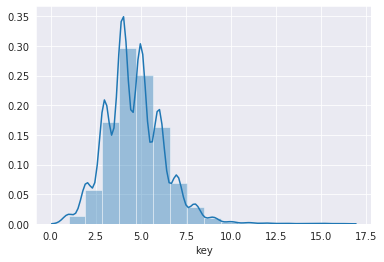

In [14]:
#Построим график 
sns.distplot(data_arc['key'].value_counts(), bins=16)
mode = stats.mode(data_arc['key'].value_counts())
print('Mode is: ',mode[0][0])

Key - содержит номер партии
- Количество итераций обработки отличается для каждой партии от 1 до 16. Мода = 4

### Разберем, что такое активная и реактивная мощности:

- `Активная мощность (Real Power)`

    Единица измерения — ватт (русское обозначение: Вт, киловатт - кВт; международное: ватт -W, киловатт - kW).

    Среднее за период Τ  значение мгновенной мощности называется активной  мощностью, и

    выражается формулой:
    

$$ P =  {1 \over T} \int\limits_{0}^{T} p(t) dt $$



- `Реактивная мощность (Reactive Power)`

    Единица измерения — вольт-ампер реактивный (русское обозначение: вар, кВАР; международное: var).

    Реактивная мощность — величина, характеризующая нагрузки, создаваемые в электротехнических устройствах колебаниями энергии электромагнитного поля в цепи синусоидального переменного тока, равна произведению среднеквадратичных значений напряжения U и тока I, умноженному на синус угла сдвига фаз φ между ними:
    $$ Q = U * I * Sin\varphi $$
     (если ток отстаёт от напряжения, сдвиг фаз считается положительным, если опережает — отрицательным). Реактивная мощность связана с полной мощностью S и активной мощностью P  соотношением: 
     $$ | Q | = {\sqrt{S^2 - P^2}} $$
 
 
 
 
- `Полная мощность (Apparent Power)`

    Единица полной электрической мощности — вольт-ампер (русское обозначение: В·А, ВА, кВА-кило-вольт-ампер; международное: V·A, kVA).
    Полная мощность — величина, равная произведению действующих значений периодического электрического тока I в цепи и напряжения U на её зажимах:
    $$ S = U * I $$ 
    соотношение полной мощности с активной и реактивной мощностями выражается в следующем виде:
    $$  S  = {\sqrt{P^2 + Q^2}} $$
    где P — активная мощность, Q — реактивная мощность (при индуктивной нагрузке Q›0, а при ёмкостной Q‹0). Векторная зависимость между полной, активной и реактивной мощностью выражается формулой: 
    
    $$ \overrightarrow S = \overrightarrow P + \overrightarrow Q $$
    
    Полная мощность имеет практическое значение, как величина, описывающая нагрузки, фактически налагаемые потребителем на элементы подводящей электросети (провода, кабели, распределительные щиты, трансформаторы, линии электропередачи), так как эти нагрузки зависят от потребляемого тока, а не от фактически использованной потребителем энергии. Именно поэтому полная мощность трансформаторов и распределительных щитов измеряется в вольт-амперах, а не в ваттах.


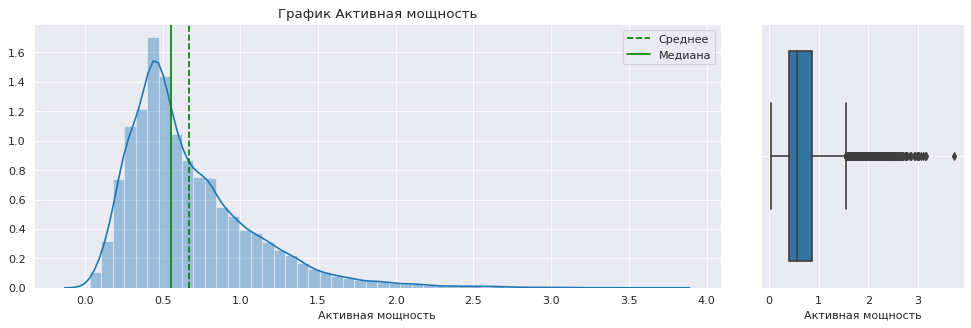

In [15]:
#Посмотрим на распределение активной мощности
ds.sns_draw(data_arc,'Активная мощность')

- распределение напоминает нормальное со сдвигом влево

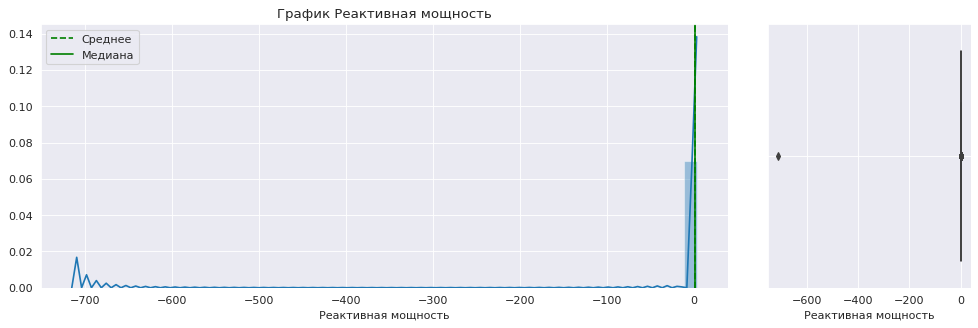

In [16]:
#Посмотрим на распределение реактивной мощности
ds.sns_draw(data_arc, 'Реактивная мощность')

- Видим аномальное значение реактивной мощности. Попробуем избавиться от него и посмотрим на результат

In [17]:
#Избавимся от выбросов меньше нуля
data_arc = data_arc[data_arc['Реактивная мощность'] >= 0]

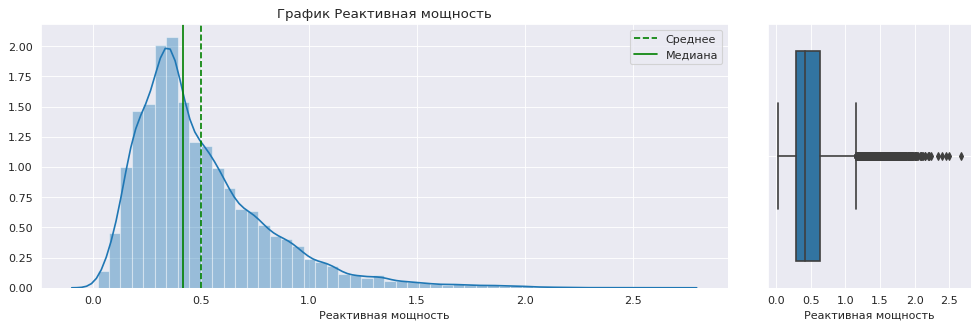

In [18]:
#Еще раз посмотрим на распределение реактивной мощности после удаления выбросов
ds.sns_draw(data_arc, 'Реактивная мощность')

Корреляция активной и реактивной мощности 0.9631819131519803


<Figure size 1440x720 with 0 Axes>

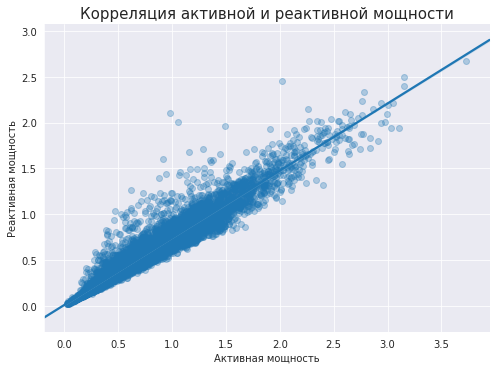

In [19]:
#Проверим корреляцию между активной и реактивной мощностями
print('Корреляция активной и реактивной мощности', data_arc['Активная мощность'].corr(data_arc['Реактивная мощность']))
plt.figure(figsize=(20,10))
sns.lmplot(x='Активная мощность', y='Реактивная мощность',data=data_arc, scatter_kws={'alpha':0.3}, aspect=14/10)
plt.title('Корреляция активной и реактивной мощности', fontsize=15)
plt.show();

Реактивная и активная мощности очень сильно коррелируют между собой. Возможна переобучаемость модели в дальнейшем. 

Имея данные по активной и реактивной мощности можем ввести новый признак "Полная мощность" по следующей формуле:

$$ S=\sqrt{P^2+Q^2} $$
где: $P$ — активная мощность, $Q$ — реактивная мощность

In [20]:
#Напишем функцию по расчету Полной мощности
def full_power(row):
    full_power = math.sqrt(row['Активная мощность']**2 + row['Реактивная мощность']**2)
    return full_power

In [21]:
data_arc['Полная мощность'] = data_arc.apply(full_power, axis=1)

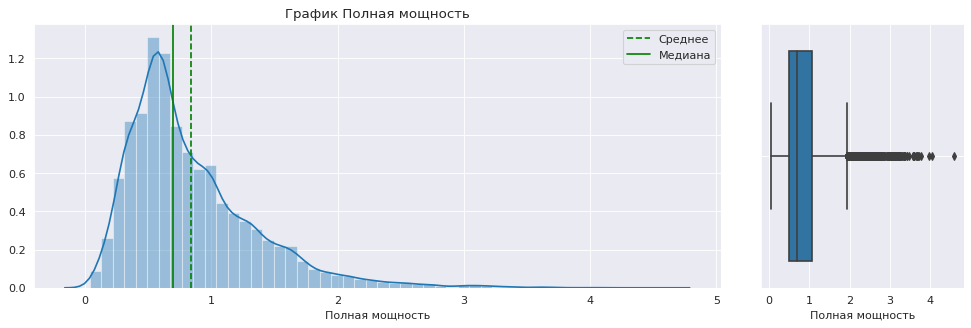

In [22]:
#Посмотрим на распределение Полной мощности
ds.sns_draw(data_arc, 'Полная мощность')

In [23]:
data_arc.head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Полная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0.807239


### Вывод:

- Изучили датасет data_arc
- Проверили на дубликаты и пустые значения. Их у нас не оказалось.
- Изменили типы данных на datetime в столбца `начало нагрева дугой` и `конец нагрева дугой`
- Избавились от аномальных значений `-715` в Реактивной мощности. 
- Разобрались, что такое активная и реактивная мощности. Так же из-за сильной корреляции между активной и реактивной мощностями, добавили новый признак `полная мощность`. 

### `Data_Bulk Dataset` : Данные о подаче сыпучих материалов (объём);

In [24]:
ds.dataset_info(data_bulk)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
key        3129 non-null int64
Bulk 1     252 non-null float64
Bulk 2     22 non-null float64
Bulk 3     1298 non-null float64
Bulk 4     1014 non-null float64
Bulk 5     77 non-null float64
Bulk 6     576 non-null float64
Bulk 7     25 non-null float64
Bulk 8     1 non-null float64
Bulk 9     19 non-null float64
Bulk 10    176 non-null float64
Bulk 11    177 non-null float64
Bulk 12    2450 non-null float64
Bulk 13    18 non-null float64
Bulk 14    2806 non-null float64
Bulk 15    2248 non-null float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Количество дубликатов: 0


In [25]:
#количество уникальных значений Key
len(data_bulk['key'].unique())

3129

- Типы данных указаны верно. Дубликаты отсутствуют.
- Видим большое количество пропущенных значений в датасете из-за того что для каждой партии добавляют опредленное сочетание сыпучих материалов.

### Data_Bulk_time - Данные о подаче сыпучих материалов (время);

In [26]:
ds.dataset_info(data_bulk_time)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
key        3129 non-null int64
Bulk 1     252 non-null object
Bulk 2     22 non-null object
Bulk 3     1298 non-null object
Bulk 4     1014 non-null object
Bulk 5     77 non-null object
Bulk 6     576 non-null object
Bulk 7     25 non-null object
Bulk 8     1 non-null object
Bulk 9     19 non-null object
Bulk 10    176 non-null object
Bulk 11    177 non-null object
Bulk 12    2450 non-null object
Bulk 13    18 non-null object
Bulk 14    2806 non-null object
Bulk 15    2248 non-null object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
5,6,NaN,NaN,NaN,2019-05-03 13:59:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:53:27,NaN,2019-05-03 13:53:27,2019-05-03 13:53:27
6,7,NaN,NaN,NaN,2019-05-03 14:29:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:22:19,NaN,2019-05-03 14:22:19,2019-05-03 14:22:19
7,8,NaN,NaN,NaN,2019-05-03 15:04:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:55:46,NaN,2019-05-03 14:55:46,2019-05-03 14:55:46
8,9,NaN,NaN,NaN,2019-05-03 15:47:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:41:00,NaN,2019-05-03 15:41:00,2019-05-03 15:41:00
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:18:52,NaN,2019-05-03 16:18:52,2019-05-03 16:18:52


,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


Количество дубликатов: 0


- Наблюдаем большое количество пропущенных значений в датасете
- Дубликатов не имеем, Имеются типы данных, которые нужно исправить
- В построении нашей будущей модели данный датасет использовать не будем, поэтому нет необходимости проводить его предобработку

### Data_gas - данные о продувке сплава газом;

In [27]:
ds.dataset_info(data_gas)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
key      3239 non-null int64
Газ 1    3239 non-null float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Количество дубликатов: 0


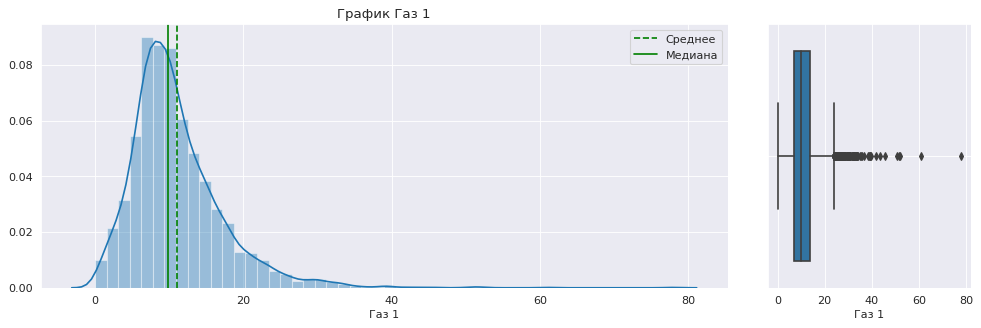

In [28]:
ds.sns_draw(data_gas, 'Газ 1')

In [29]:
#количество уникальных значений Key
len(data_gas['key'].unique())

3239

- Исходя из полученных данных можно сказать, что распределение нормальное. 
- Дубликатов не имеем, типы данных указаны верно. 
- Незаполненныз значений не имеем

### Data_temp - Результаты измерения температуры;

In [30]:
ds.dataset_info(data_temp)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
key             15907 non-null int64
Время замера    15907 non-null object
Температура     13006 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


,key,Температура
count,15907.000000,13006.000000
mean,1607.880870,1591.840920
std,942.212073,21.375851
min,1.000000,1191.000000
25%,790.000000,1581.000000
50%,1618.000000,1591.000000
75%,2427.000000,1601.000000
max,3241.000000,1705.000000


Количество дубликатов: 0


In [31]:
#Изменим тип данных у время замера
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'])

In [32]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
key             15907 non-null int64
Время замера    15907 non-null datetime64[ns]
Температура     13006 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


In [63]:
#Посмотрим на распределение температуры
ds.sns_draw(data_temp, 'Температура')

In [64]:
#посмотрим на пропуски Температура
data_temp[data_temp['Температура'].isnull()].head(10)

In [66]:
data_temp[data_temp['Температура'].isnull()].tail()

- В датасете отсутствуют некоторые данные по температурам, мы их удалим для дальнейшей работы.
- Распределение выглядит нормальным, но имеются аномальные выбросы
- Начиная с 2500 партии наблюдаем пропущенные значения
- Исправили тип данных у Время замера на datetime
- Дубликатов не имеется

### Data_Wire  -  данные о проволочных материалах (объём);

In [ ]:
ds.dataset_info(data_wire)

- Дубликатов не имеем 
- Имеются пустые значения в датасете, скорее всего они пустые потому что различные виды проволочных материалов поступали в разных пропорциях в разные промежутки времени.
- Типы данных указаны верно

### Data_Wire_time - данные о проволочных материалах (время).

In [ ]:
ds.dataset_info(data_wire_time)

- Дубликатов не имеется
- Имеются пустые значения
- Типы данных в Wire 1 указаны неверно, но менять не будет так как данный датасет использовать в дальнейшем не будем.

### Вывод по Исследовательскому Анализу Данных

- Загрузили данные, изучили.
- Избавились от некоторых аномальных значений.
- Изменили типы данных, в некоторых датасетах были неправильно указаны данные типа Datetime
- Проверили данные на пропуски и дубликаты.
- В датасете data_arc ввели сразу новый признак "Полная мощность"
- В таргете отсутствуют данные начиная с 2500й партии, поэтому в дальнейшем нужно будет провести срез данных начиная с 2500 партии.


## 2. Предобработка данных

#### План работы:

- Объединим таблицы в один датасет для нашей будущей модели
- Обработаем пропуски 
- Целевой признак - Последняя температура 
- Проведем срез данных по Key до начиная с 2500 партии

In [41]:
#Создадим новый признак "Общее время нагрева дугой", переведем в секунды
data_arc['Общее время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc['Общее время нагрева дугой'] = data_arc['Общее время нагрева дугой'].dt.seconds

In [42]:
# Поcле 2500 партии значения температуры есть только для первого измерения. 
# Поэтому будем использовать только партии до 2500 номера.
data_temp = data_temp.query('key < 2500')
data_arc = data_arc.query('key < 2500')
data_bulk = data_bulk.query('key < 2500')
data_wire = data_wire.query('key < 2500')

In [43]:
# определим количество итераций нагрева
data_arc_c = data_arc.groupby(by = 'key', as_index = False).count()[['key', 'Начало нагрева дугой']]
data_arc_c.columns = ['key', 'Количество итераций нагрева']

In [44]:
# сгруппируем данные по партиям
data_arc = data_arc.groupby(by = 'key', as_index = False).sum()

# добавим информацию о количестве итераций нагрева по ключу key
data_arc = data_arc.merge(data_arc_c, how = 'left', on = 'key')

In [45]:
#Так как признаки активная и реактивная мощность сильно коррелируют между собой будем использовать признак только полная мощность.
data_arc = data_arc[['key', 'Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']]

In [46]:
data_arc.head(5)

,key,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
0,1,5.826395,1098,5
1,2,3.649216,811,4
2,3,2.989534,655,5
3,4,3.814962,741,4
4,5,4.035758,869,4


<Figure size 1080x720 with 0 Axes>

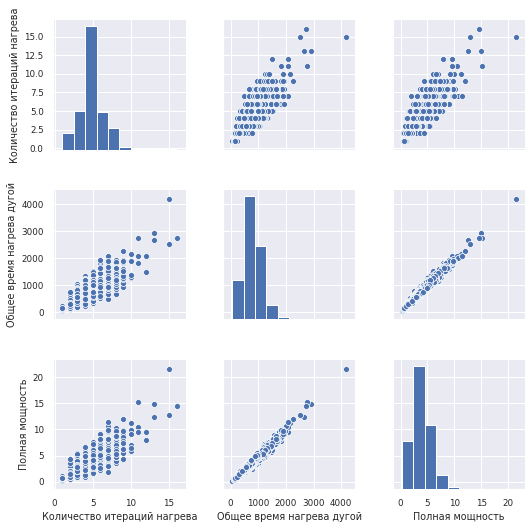

In [47]:
#Посмотрим на корреляцию имеющихся признаков
plt.figure(figsize=(15,10))
sns.set(font_scale=0.8)
sns.pairplot(data_arc[['Количество итераций нагрева', 'Общее время нагрева дугой', 'Полная мощность']], 
             kind="scatter")
plt.show();

In [48]:
data_arc[['Полная мощность', 'Общее время нагрева дугой', 'Количество итераций нагрева']].corr()

,Полная мощность,Общее время нагрева дугой,Количество итераций нагрева
Полная мощность,1.000000,0.982899,0.760402
Общее время нагрева дугой,0.982899,1.000000,0.795958
Количество итераций нагрева,0.760402,0.795958,1.000000


Сильная корреляция между полной мощностью и общим временем нагрева дугой. Попробуем избавиться от времени нагрева дугой для нашей будущей модели

In [49]:
#Уберем из датасета столбец "Общее время нагрева дугой"
data_arc = data_arc[['key', 'Полная мощность', 'Количество итераций нагрева']]

In [50]:
data_arc.head(5)

,key,Полная мощность,Количество итераций нагрева
0,1,5.826395,5
1,2,3.649216,4
2,3,2.989534,5
3,4,3.814962,4
4,5,4.035758,4


In [67]:
#Очистим пропуски в данных в таблице data_temp
data_temp = data_temp.dropna(subset=['Температура']).reset_index(drop=True)
data_temp = data_temp.sort_values(by=['Время замера'])

In [68]:
#Удалим информацию о партиях по которым известно только одно измерение температуры.
count = data_temp.groupby(by = 'key', as_index = False).count()
one = count[count['Время замера'] == 1]['key'].tolist()
data_temp = data_temp.query('key not in @one')

In [69]:
#Сгруппируем данные по партии по первым и последним значениям, последние значения необходимо будет предсказывать.
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'Время замера 1', 'Время замера 2', 'Температура 1', 'Температура 2']
data_temp = data_temp[['key', 'Температура 1', 'Температура 2']]

In [70]:
data_temp.head(5)

,key,Температура 1,Температура 2
0,1,1613.0,1613.0
1,2,1602.0,1602.0
2,3,1599.0,1599.0
3,4,1625.0,1625.0
4,5,1602.0,1602.0


#### Объединим данные в одну таблицу

In [71]:
# объединим обработанные датасеты по ключу key
data = (data_temp.merge(data_arc, how = 'left', on = 'key')
                 .merge(data_wire, how = 'left', on = 'key')
                 .merge(data_bulk, how = 'left', on = 'key')
                 .merge(data_gas, how = 'left', on = 'key')
       )


# заполним пропуски образовавшиеся после объединения таблиц нулями
data = data.fillna(0)

# переименуем столбцы для корректной работы lgbm
data = data.rename(columns={'Температура 1': 'First_temp',
                            'Температура 2': 'Last_temp',
                            'Полная мощность': 'Full_power',
                            'Количество итераций нагрева':'Heating_iterations',
                            'Газ 1': 'Gas'})

# уберем колонку-индентификатор key, которую мы использовали
# для объединения датасетов
data = data.drop(['key'], axis = 1)

In [72]:
data.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
0,1613.0,1613.0,5.826395,5,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986
1,1602.0,1602.0,3.649216,4,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561
2,1599.0,1599.0,2.989534,5,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793
3,1625.0,1625.0,3.814962,4,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219
4,1602.0,1602.0,4.035758,4,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692


In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2475 entries, 0 to 2474
Data columns (total 29 columns):
First_temp            2475 non-null float64
Last_temp             2475 non-null float64
Full_power            2475 non-null float64
Heating_iterations    2475 non-null int64
Wire 1                2475 non-null float64
Wire 2                2475 non-null float64
Wire 3                2475 non-null float64
Wire 4                2475 non-null float64
Wire 5                2475 non-null float64
Wire 6                2475 non-null float64
Wire 7                2475 non-null float64
Wire 8                2475 non-null float64
Wire 9                2475 non-null float64
Bulk 1                2475 non-null float64
Bulk 2                2475 non-null float64
Bulk 3                2475 non-null float64
Bulk 4                2475 non-null float64
Bulk 5                2475 non-null float64
Bulk 6                2475 non-null float64
Bulk 7                2475 non-null float64
Bulk 8         

После объединения таблиц мы получили набор признаков с целевым признаком. 

In [74]:
#Разделим нашу выборку на тестовую и обучающие выборки
train, test = train_test_split(data, test_size = .30, random_state = 42)

In [75]:
train.columns

Index(['First_temp', 'Last_temp', 'Full_power', 'Heating_iterations', 'Wire 1',
       'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8',
       'Wire 9', 'Bulk 1', 'Bulk 2', 'Bulk 3', 'Bulk 4', 'Bulk 5', 'Bulk 6',
       'Bulk 7', 'Bulk 8', 'Bulk 9', 'Bulk 10', 'Bulk 11', 'Bulk 12',
       'Bulk 13', 'Bulk 14', 'Bulk 15', 'Gas'],
      dtype='object')

В нашей таблице имеются количественные признаки с разными разбросами, поэтому проведем масштабирование признаков

In [76]:
#Масштабируем количественные признаки
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('Last_temp')]
scaler = MinMaxScaler()
scaler.fit(train[numeric])

# масштабируем обучающую выборку
train[numeric] = scaler.transform(train[numeric])

# масштабируем тестовую выборку
test[numeric] = scaler.transform(test[numeric])

In [77]:
print('Размер обучающей выборки:', train.shape)
print('Размер тестовой выобрки:', test.shape)

Размер обучающей выборки: (1732, 29)
Размер тестовой выобрки: (743, 29)


In [78]:
train.head(5)

,First_temp,Last_temp,Full_power,Heating_iterations,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,...,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15,Gas
1840,0.276730,1585.0,0.130278,0.133333,0.307736,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.130990,0.000000,0.0,0.312893,0.000000,0.077957
2240,0.283019,1586.0,0.166019,0.333333,0.462832,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.188202
543,0.484277,1618.0,0.324607,0.333333,0.461179,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.222823,0.0,0.415094,0.372840,0.269691
1721,0.371069,1600.0,0.164281,0.200000,0.433125,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.110871,0.0,0.185535,0.501235,0.124366
2193,0.245283,1580.0,0.305321,0.333333,0.233267,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.258786,0.277447,0.0,0.308176,0.000000,0.135663


### Вывод по Предобработке данных

- Провели предобработку данных
- Избавились от выборосов и пустых значений
- Соединили таблицы в одну итоговую таблицу
- Разделили выборки на 30% тестовой выборки и 70% обучающей выборки
- Также провели масштабирование признаков
    
    

## 3. Обучение моделей и подбор параметров

In [79]:
# Определим target и features для обучающей выборки
features_train = train.drop(['Last_temp'], axis = 1)
target_train = train['Last_temp']

# Определим target и features для тестовой выборки
features_test = test.drop(['Last_temp'], axis = 1)
target_test = test['Last_temp']

In [80]:
#Определим Модели какие будем использовать 

models = {
    'CatBoostRegressor': CatBoostRegressor(),
    'LGBMRegressor': lgb.LGBMRegressor(),
    'XGBRegressor': xgboost.XGBRegressor(),
    'LinearRegression': LinearRegression()
}


# Параметры для каждой модели, которые будем подбирать
params = {
    'CatBoostRegressor':{
          'loss_function':['MAE'],
          'n_estimators': np.arange(300, 700, 100),  
          'learning_rate': np.arange(0.03, 0.12, 0.02),
          'random_state':[17],
          'depth': np.arange(3, 7)
    },        

    'LinearRegression':{
            'fit_intercept' : [True, False],
            'normalize':[True,False]
    },
    
    
    'LGBMRegressor': {
        'boosting_type': ['gbdt', 'dart', 'goss', 'rf'],
        'objective': ['regression'],
        'learning_rate': [0.001, 0.01, 0.02, 0.03],
        'num_iterations':[500],
        'random_state': [42], 
        'max_depth': np.arange(2, 10),
        'metric': ['mae']
        },

    
    'XGBRegressor': {
        'min_child_weight': [10,20,30],
        'gamma': [5],
        'subsample': [1.0],
        'colsample_bytree': [1.0],
        'max_depth': [5,10,20],
        'eval_metric' :['mae']
        }
}

In [55]:
%%time
result_list = []
ds.fit(features_train, target_train)

0:	learn: 10.0825044	total: 46.4ms	remaining: 13.9s
1:	learn: 10.0325233	total: 47.2ms	remaining: 7.03s
2:	learn: 9.9792197	total: 47.8ms	remaining: 4.73s
3:	learn: 9.9207557	total: 48.4ms	remaining: 3.58s
4:	learn: 9.8855182	total: 49ms	remaining: 2.89s
5:	learn: 9.8491390	total: 49.6ms	remaining: 2.43s
6:	learn: 9.7588321	total: 50.2ms	remaining: 2.1s
7:	learn: 9.7285742	total: 50.8ms	remaining: 1.85s
8:	learn: 9.6671848	total: 51.4ms	remaining: 1.66s
9:	learn: 9.6082487	total: 52ms	remaining: 1.51s
10:	learn: 9.5715952	total: 52.6ms	remaining: 1.38s
11:	learn: 9.5309671	total: 53.2ms	remaining: 1.27s
12:	learn: 9.4974069	total: 53.8ms	remaining: 1.19s
13:	learn: 9.4580557	total: 54.4ms	remaining: 1.11s
14:	learn: 9.4188704	total: 55ms	remaining: 1.04s
15:	learn: 9.3973346	total: 55.6ms	remaining: 987ms
16:	learn: 9.3445089	total: 56.2ms	remaining: 935ms
17:	learn: 9.3216142	total: 56.7ms	remaining: 889ms
18:	learn: 9.2658448	total: 57.3ms	remaining: 848ms
19:	learn: 9.2269455	total:

In [56]:
#выведем наилучшие параметры подобранные для наших моделей
result_list

[{'model': 'CatBoostRegressor',
  'train_mae_score': 4.002695455142852,
  'test_mae_score': 5.842208134557774,
  'best_params': {'depth': 4,
   'learning_rate': 0.11000000000000001,
   'loss_function': 'MAE',
   'n_estimators': 600,
   'random_state': 17}},
 {'model': 'LGBMRegressor',
  'train_mae_score': 4.910219805509972,
  'test_mae_score': 6.065231149066106,
  'best_params': {'boosting_type': 'gbdt',
   'learning_rate': 0.02,
   'max_depth': 4,
   'metric': 'mae',
   'num_iterations': 500,
   'objective': 'regression',
   'random_state': 42}},
 {'model': 'XGBRegressor',
  'train_mae_score': 3.6326051496192986,
  'test_mae_score': 6.361557807768338,
  'best_params': {'colsample_bytree': 1.0,
   'eval_metric': 'mae',
   'gamma': 5,
   'max_depth': 5,
   'min_child_weight': 30,
   'subsample': 1.0}},
 {'model': 'LinearRegression',
  'train_mae_score': 7.925578060046872,
  'test_mae_score': 7.895936284391633,
  'best_params': {'fit_intercept': True, 'normalize': True}}]

In [65]:
#Сохраним все в табличку
results = pd.DataFrame(result_list, columns=['model','train_mae_score','test_mae_score','best_params'])
results.set_index("model", inplace = True)

In [66]:
results

,train_mae_score,test_mae_score,best_params
model,,,
CatBoostRegressor,4.002695,5.842208,"{'depth': 4, 'learning_rate': 0.11000000000000..."
LGBMRegressor,4.910220,6.065231,"{'boosting_type': 'gbdt', 'learning_rate': 0.0..."
XGBRegressor,3.632605,6.361558,"{'colsample_bytree': 1.0, 'eval_metric': 'mae'..."
LinearRegression,7.925578,7.895936,"{'fit_intercept': True, 'normalize': True}"


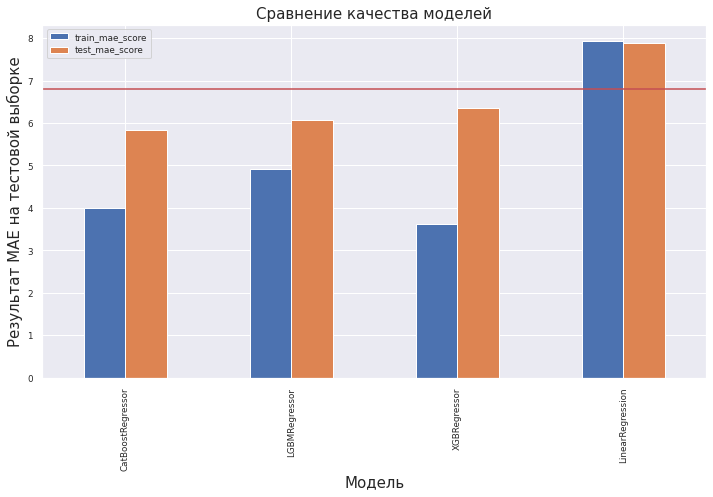

In [76]:
#Посмотрим на графике на результаты MAE на обучающей и тестовой выборках
plt.figure(figsize=(10, 7))
plt.subplot(111)
results.plot(kind='bar', ax=plt.gca()).hlines(6.8, -1, 5, color = 'r')
plt.xlabel('Модель', fontsize=15)
plt.ylabel('Результат MAE на тестовой выборке', fontsize=15)
plt.title('Сравнение качества моделей', fontsize=15)
plt.tight_layout()

Вывод:

- Провели подбор параметров к 4м моделям CatBoost, LightGBM, XGboost и LinearRegression
- Наилучшие результаты получили у CatBoost с результатом 5.8 на тестовой выборке
- У LightGBM и XGBoost по ~6 MAE на тестовой выборке
- Хуже всего показала результат модель LinearRegression с результатом 7.8 на тестовой выборке

### Финальная модель на тестовой выборке с наилучшими параметрами

In [81]:
#С подобранными параметрами будем использовать модель CatBoost на тестовой выборке
model = CatBoostRegressor(depth=4, 
                          learning_rate = 0.11000000000000001, 
                          loss_function = 'MAE', 
                          n_estimators = 600, 
                          random_state = 17,
                          verbose = 0)

model.fit(features_train,target_train)
predictions = model.predict(features_test)
print('MAE на тестовой выборке:', mean_absolute_error(predictions,target_test))

MAE на тестовой выборке: 5.842208134557774


### Feature Importance

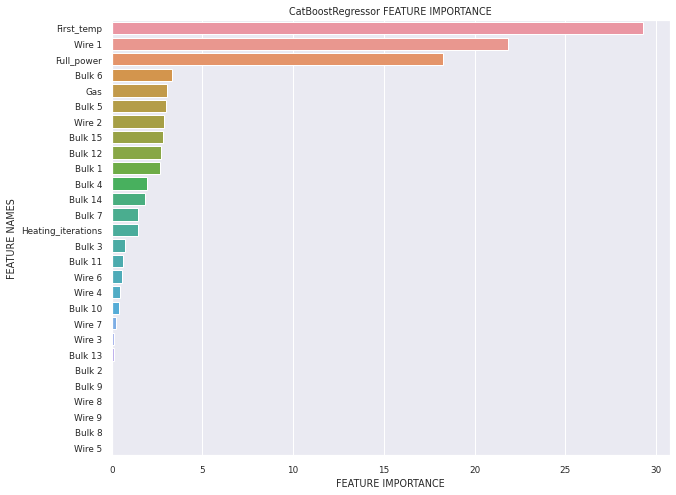

In [83]:
#Посмотрим feature importance у модели lightgbm
ds.plot_feature_importance(model.feature_importances_,features_test.columns,'CatBoostRegressor ')

Мы провели финальное тестирование нашей модели. Модель показала результат MAE 5.8 на тестовой выборке, что соответствует условию решения задачи. Также модель предсказывает лучше, чем наивная модель со средними значениями. 

## Общий вывод

- Мы провели Исследовательский анализ данных 
- Обработали пропуски и выбросы, которые выявили в таблицах
- Добавили несколько новых признаков для нашей модели
- Провели масштабирование признаков
- Для обучения использовали 4 модели : CatBoostRegressor, LightGBMRegressor, XGboostRegressor, LinearRegression
- Провели подбор гиперпараметров с помощью GridSearchCV
- Набрали наилучший результат MAE 5.8 на тестовой выборке CatBoostRegressor
- Так же выявили признаки, которые больше всего влияют на модель это Начальная температура, Полная мощность и Wire 1